In [198]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")


In [2]:
src_dest_df = pd.read_parquet("src_dest_df.parquet")
region_geo_lookup_aws = pd.read_pickle("region_geo_lookup_aws.pkl")

In [3]:
src_dest_df.timestamp = pd.DatetimeIndex(src_dest_df.timestamp)

In [4]:
src_dest_df

,timestamp,cloud_geo_iso1,cloud_geo_iso2,latency_ms,packet_loss_percent
0,2020-03-31 08:00:00+00:00,AWS.ap-east-1,AWS.us-west-2,156.55,0.0
1,2020-03-30 17:00:00+00:00,AWS.ap-east-1,AWS.us-west-2,154.60,0.0
2,2020-03-31 05:00:00+00:00,AWS.ap-east-1,AWS.us-west-2,153.85,0.0
3,2020-03-31 09:00:00+00:00,AWS.ap-east-1,AWS.us-west-2,155.60,0.0
4,2020-03-31 22:00:00+00:00,AWS.ap-east-1,AWS.us-west-2,155.00,0.0
...,...,...,...,...,...
495076,2020-03-21 10:00:00+00:00,AWS.ap-southeast-2,AWS.eu-west-2,139.25,0.0
495077,2020-03-26 17:00:00+00:00,AWS.ap-southeast-2,AWS.eu-north-1,149.95,0.0
495078,2020-03-26 02:00:00+00:00,AWS.ap-southeast-2,AWS.ap-northeast-1,54.75,0.0
495079,2020-03-31 04:00:00+00:00,AWS.ap-southeast-2,AWS.us-west-2,71.50,0.0


In [5]:
src_dest_df.describe(include="all")

<ipython-input-5-b00b7f623099>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  src_dest_df.describe(include="all")


,timestamp,cloud_geo_iso1,cloud_geo_iso2,latency_ms,packet_loss_percent
count,495081,495081,495081,495081.000000,495081.0
unique,2185,17,16,NaN,NaN
top,2020-02-08 18:00:00+00:00,AWS.ca-central-1,AWS.us-west-2,NaN,NaN
freq,238,31949,31968,NaN,NaN
first,2019-12-31 23:00:00+00:00,NaN,NaN,NaN,NaN
last,2020-03-31 23:00:00+00:00,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,76.883900,0.0
std,NaN,NaN,NaN,39.451658,0.0
min,NaN,NaN,NaN,4.900000,0.0
25%,NaN,NaN,NaN,47.800000,0.0


- above table clearly show  packer loss percent is 0 for all pings
-  similariy most pings are from AWS.ap-northeast-2(must be heavy development site)
- most ping are done to AWS.us-west-2( must be very cheap location for resource perspective)

In [11]:
region_geo_lookup_aws.set_index("region_name",inplace=True)

In [12]:
region_geo_lookup_aws

,cloud_service_provider,city_name,lat,lon,timestamp
region_name,,,,,
AWS.us-east-1,AWS,Virginia,38.130000,-78.450000,2020-03-30
AWS.us-east-2,AWS,Ohio,39.960000,-83.000000,2020-03-30
AWS.us-west-1,AWS,California,37.350000,-121.960000,2020-03-30
AWS.us-west-2,AWS,Oregon,46.150000,-123.880000,2020-03-30
AWS.eu-west-1,AWS,Ireland,53.000000,-8.000000,2020-03-30
AWS.eu-west-2,AWS,London,51.000000,-0.100000,2020-03-30
AWS.eu-west-3,AWS,Paris,48.860000,2.350000,2020-03-30
AWS.eu-central-1,AWS,Frankfurt,50.000000,8.000000,2020-03-30
AWS.sa-east-1,AWS,Sao Paulo,-23.340000,-46.380000,2020-03-30


#### Predict the latency from AWS.ap-east-1 to all other AWS regions in the src_dest_df.parquet

In [83]:
grp_df = src_dest_df[["cloud_geo_iso1","cloud_geo_iso2","latency_ms"]].groupby(["cloud_geo_iso1","cloud_geo_iso2"]).agg(lambda x: list(x))

##### median time between different location from the dataset

In [87]:
region2latency = grp_df.copy()
region2latency["median_latency_ms"] = grp_df.latency_ms.apply( lambda x: np.median(x))
region2latency["mean_latency_ms"] = grp_df.latency_ms.apply( lambda x: np.mean(x))
region2latency["min_latency_ms"] = grp_df.latency_ms.apply( lambda x: np.min(x))
region2latency["max_latency_ms"] = grp_df.latency_ms.apply( lambda x: np.max(x))
region2latency.drop("latency_ms",inplace=True,axis=1)


In [88]:
region2latency

median_latency_ms  mean_latency_ms  \
cloud_geo_iso1     cloud_geo_iso2                                           
AWS.ap-east-1      AWS.eu-west-1                  115.45       115.434848   
                   AWS.us-west-2                  154.70       154.698485   
AWS.ap-northeast-1 AWS.ap-northeast-2              19.05        19.048741   
                   AWS.ap-south-1                  67.00        66.969872   
                   AWS.ap-southeast-1              36.85        36.989972   
...                                                  ...              ...   
AWS.us-west-2      AWS.eu-west-3                   79.15        79.016026   
                   AWS.sa-east-1                   91.85        92.119986   
                   AWS.us-east-1                   39.45        39.462981   
                   AWS.us-east-2                   27.40        29.719883   
                   AWS.us-west-1                   12.60        12.591163   

                                       min_latency_ms  max_latency_ms  
cloud_geo_iso1     cloud_geo_iso2                                      
AWS.ap-east-1      AWS.eu-west-1               113.50          118.45  
                   AWS.us-west-2               153.05          156.70  
AWS.ap-northeast-1 AWS.ap-northeast-2           17.70           20.40  
                   AWS.ap-south-1               62.95           71.45  
                   AWS.ap-southeast-1           35.65           39.80  
...                                               ...             ...  
AWS.us-west-2      AWS.eu-west-3                74.10           80.95  
                   AWS.sa-east-1                89.75          107.40  
                   AWS.us-east-1                36.20           42.80  
                   AWS.us-east-2                25.65           38.00  
                   AWS.us-west-1                11.70           21.65  

[240 rows x 4 columns]

- to predict time between different location we can use distance a  matrix between two location
- distance can be road distance can be spehirical distance
- in this case we will assume spherical distance, although distance should be computed between satellite and source point and satellite and destination point

In [14]:
from sklearn.metrics.pairwise import pairwise_distances
from geopy.distance import geodesic

In [22]:
dist_1 = lambda x,y : geodesic(x,y).km

In [24]:
distance_mat = pairwise_distances(region_geo_lookup_aws[["lat","lon"]],metric = dist_1)

In [29]:
distance_df = pd.DataFrame(distance_mat,columns= region_geo_lookup_aws.index, index=region_geo_lookup_aws.index)
distance_df

region_name,AWS.us-east-1,AWS.us-east-2,AWS.us-west-1,AWS.us-west-2,AWS.eu-west-1,AWS.eu-west-2,AWS.eu-west-3,AWS.eu-central-1,AWS.sa-east-1,AWS.ap-southeast-1,AWS.ap-southeast-2,AWS.ap-northeast-1,AWS.ap-northeast-2,AWS.ap-south-1,AWS.ca-central-1,AWS.eu-north-1,AWS.me-south-1,AWS.ap-east-1
region_name,,,,,,,,,,,,,,,,,,
AWS.us-east-1,0.000000,443.125045,3800.237400,3804.960803,5500.460597,6082.628927,6330.674172,6657.125178,7584.944280,15624.481871,15575.405542,10979.514405,11228.673409,13002.913244,911.961689,6795.626317,11129.488349,13189.458974
AWS.us-east-2,443.125045,0.000000,3376.712776,3361.843823,5661.316195,6247.010000,6506.723486,6811.369922,7971.826909,15375.840007,15219.943526,10598.946826,10893.391753,13008.482420,984.444263,6856.128776,11251.413893,12888.957845
AWS.us-west-1,3800.237400,3376.712776,0.000000,990.277988,8152.464071,8698.673657,8992.898493,9157.926180,10369.618248,13652.913073,11946.780139,8387.499067,9111.746829,13568.634366,4078.216748,8676.006627,12931.150208,11179.770646
AWS.us-west-2,3804.960803,3361.843823,990.277988,0.000000,7449.924121,7968.865001,8264.803281,8387.999549,10940.090059,12984.075086,12274.887879,7734.655348,8355.706110,12586.879080,3841.088973,7808.282124,11977.409931,10446.027083
AWS.eu-west-1,5500.460597,5661.316195,8152.464071,7449.924121,0.000000,586.022471,859.898945,1157.278410,9235.276275,11324.025551,17318.471518,9716.364691,9074.127726,7730.489828,4676.902166,1751.613027,5639.909830,9984.612337
AWS.eu-west-2,6082.628927,6247.010000,8698.673657,7968.865001,586.022471,0.000000,295.938320,585.038540,9399.528857,10859.235201,17013.829260,9647.599026,8922.905520,7196.904645,5262.634321,1475.021411,5065.886865,9671.610293
AWS.eu-west-3,6330.674172,6506.723486,8992.898493,8264.803281,859.898945,295.938320,0.000000,428.888744,9345.402830,10731.019743,16956.242747,9752.150455,8988.989597,7017.255483,5523.053059,1546.203592,4839.773796,9646.271377
AWS.eu-central-1,6657.125178,6811.369922,9157.926180,8387.999549,1157.278410,585.038540,428.888744,0.000000,9729.079838,10308.108902,16527.706312,9409.776100,8615.730615,6616.877712,5827.085962,1221.738179,4483.779086,9225.854876
AWS.sa-east-1,7584.944280,7971.826909,10369.618248,10940.090059,9235.276275,9399.528857,9345.402830,9729.079838,0.000000,15990.606611,13407.677484,18556.863503,18307.992329,13752.608481,8106.373742,10873.497782,11774.215499,18032.725972


In [89]:
region2latency["distance"] = list(map(lambda x :distance_df.loc[x],list(region2latency.index)))

In [90]:
region2latency.corr()

,median_latency_ms,mean_latency_ms,min_latency_ms,max_latency_ms,distance
median_latency_ms,1.000000,0.998678,0.997941,0.932860,0.861049
mean_latency_ms,0.998678,1.000000,0.996920,0.939242,0.861706
min_latency_ms,0.997941,0.996920,1.000000,0.930039,0.866645
max_latency_ms,0.932860,0.939242,0.930039,1.000000,0.802446
distance,0.861049,0.861706,0.866645,0.802446,1.000000


- not high correlation in latency and distance

In [131]:
## lets build some model
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV,train_test_split
from sklearn.metrics import mean_squared_error,r2_score


In [94]:
lbl_enc = LabelEncoder()
lbl_enc.fit(region_geo_lookup_aws.index)

LabelEncoder()

In [103]:
y = region2latency["median_latency_ms"].values
X = region2latency["distance"].reset_index()

In [107]:
X["cloud_geo_iso1"] = lbl_enc.transform(X["cloud_geo_iso1"])
X["cloud_geo_iso2"] = lbl_enc.transform(X["cloud_geo_iso2"])

In [111]:
reg = RandomForestRegressor(oob_score=True)
reg.fit(X.values,y)

RandomForestRegressor(oob_score=True)

In [114]:
reg.oob_score_ ##R2 on unseen data

0.8717624499636943

In [123]:
params = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [50,80, 100, 200, 300]}
reg = RandomForestRegressor(bootstrap=True)
ran_cv = RandomizedSearchCV(reg,params,n_iter = 100, cv = 3, verbose=1, random_state=42)
ran_cv.fit(X.values,y)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 80, 100, 200,
                                                         300]},
                   random_state=42, verbose=1)

In [124]:
ran_cv.best_estimator_

RandomForestRegressor(max_depth=60, min_samples_split=10, n_estimators=300)

In [130]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.1)

In [149]:
reg = ran_cv.best_estimator_
reg.fit(X_train,y_train)
y_pred = reg.predict(X_test)
print(mean_squared_error(y_test,y_pred))
print(r2_score(y_test,y_pred))

350.6021852362517
0.7060493075843984


In [154]:
lbl_enc.classes_

(18,)

In [161]:
df_1 = pd.DataFrame({"src":['AWS.ap-east-1']*17,"dest":lbl_enc.classes_[1:]})

In [171]:
df_1["distance"] = df_1.apply(lambda x : distance_df.loc[(x["src"],x["dest"])],axis=1)

In [174]:
X = df_1.copy()
X["src"] = lbl_enc.transform(X["src"])
X["dest"] = lbl_enc.transform(X["dest"])
latency = reg.predict(X)
df_1["latency"] = latency

In [176]:
df_1

,src,dest,distance,latency
0,AWS.ap-east-1,AWS.ap-northeast-1,2849.301483,27.761231
1,AWS.ap-east-1,AWS.ap-northeast-2,2093.196339,25.087389
2,AWS.ap-east-1,AWS.ap-south-1,4302.930384,53.548670
3,AWS.ap-east-1,AWS.ap-southeast-1,2571.027839,27.603675
4,AWS.ap-east-1,AWS.ap-southeast-2,7348.757474,80.936167
5,AWS.ap-east-1,AWS.ca-central-1,12457.839006,114.366569
6,AWS.ap-east-1,AWS.eu-central-1,9225.854876,126.072695
7,AWS.ap-east-1,AWS.eu-north-1,8238.509355,77.232951
8,AWS.ap-east-1,AWS.eu-west-1,9984.612337,125.171176
9,AWS.ap-east-1,AWS.eu-west-2,9671.610293,126.141566


##### seems accruacy is not good, may be required more features

/home/prateek/.virtualenvs/cv_p38/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


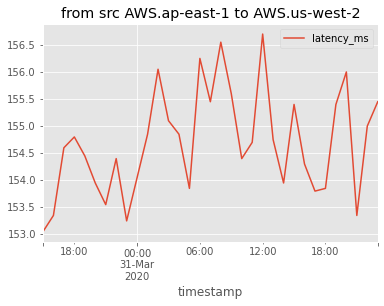

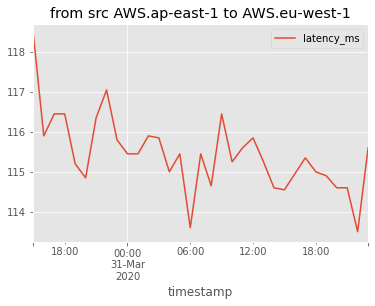

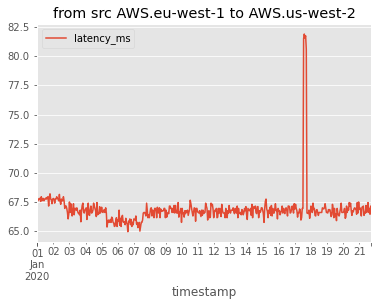

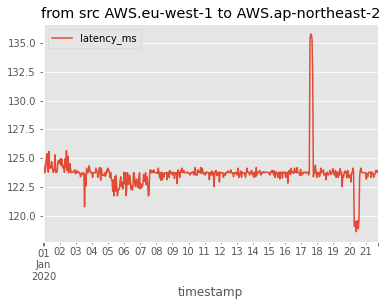

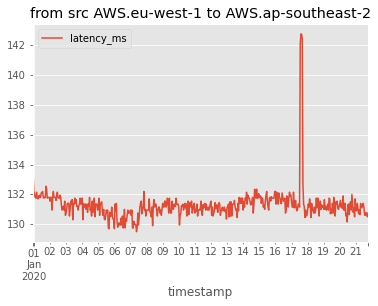

...

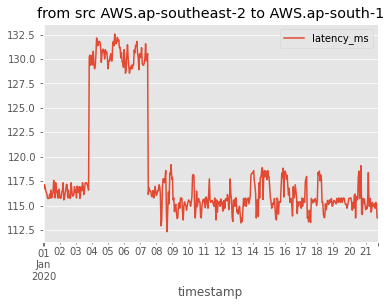

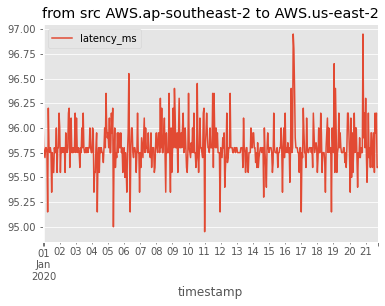

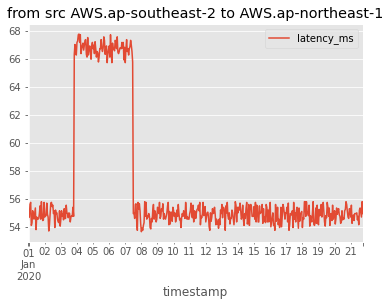

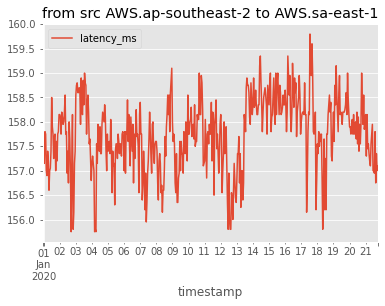

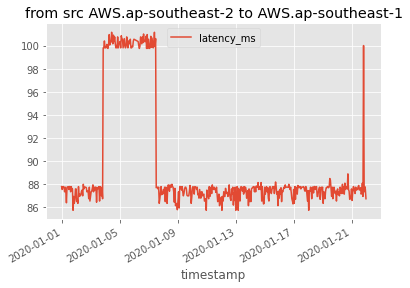

In [205]:
for i in src_dest_df.cloud_geo_iso1.unique():
    for j in src_dest_df.cloud_geo_iso2.unique():
        df_1 = src_dest_df[((src_dest_df.cloud_geo_iso1==i )& (src_dest_df.cloud_geo_iso2==j)) ]
        if df_1.shape[0]!=0:
            df_1.sort_values("timestamp").head(500).plot(x="timestamp",y="latency_ms",title="from src {} to {}".format(i,j))

### GeneralizedESDTestAD

`GeneralizedESDTestAD` detects anomaly based on generalized extreme Studentized deviate (ESD) test.

Please note a key assumption of generalized ESD test is that normal values follow an approximately normal distribution


### LevelShiftAD
`LevelShiftAD` detects shift of value level by tracking the difference between median values at two sliding time windows next to each other. It is not sensitive to instantaneous spikes and could be a good choice if noisy outliers happen frequently.



In [241]:
from adtk.detector import GeneralizedESDTestAD,LevelShiftAD,PersistAD
from adtk.visualization import plot

In [207]:
for i in src_dest_df.cloud_geo_iso1.unique():
    for j in src_dest_df.cloud_geo_iso2.unique():
        df_1 = src_dest_df[((src_dest_df.cloud_geo_iso1==i )& (src_dest_df.cloud_geo_iso2==j)) ]
        if df_1.shape[0]!=0:
            esd_ad = GeneralizedESDTestAD(alpha=0.3)
            anomalies = esd_ad.fit_detect(df_1.values)
            plot(s, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker")

In [239]:
(anomalies1 | anomalies2).sum()

35

[<AxesSubplot:>]

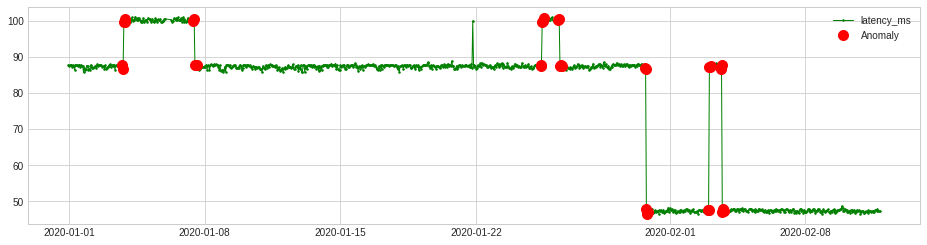

In [240]:
esd_ad = GeneralizedESDTestAD(alpha=0.05)
anomalies1 = esd_ad.fit_detect(df_1.latency_ms[:1000])
level_shift_ad = LevelShiftAD(c=6.0, side='both', window=5)
anomalies2 = level_shift_ad.fit_detect(df_1.latency_ms[:1000])
persist_ad = PersistAD(c=3.0, side='positive')
anomalies = persist_ad.fit_detect(s)
plot(df_1.latency_ms[:1000], anomaly=(anomalies1 | anomalies2), ts_linewidth=1,ts_color="green", ts_markersize=3, anomaly_markersize=10, anomaly_color='red', anomaly_tag="marker")

In [228]:
anomalies

timestamp
2019-12-31 23:00:00+00:00    False
2020-01-01 00:00:00+00:00    False
2020-01-01 01:00:00+00:00    False
2020-01-01 02:00:00+00:00    False
2020-01-01 03:00:00+00:00    False
                             ...  
2020-02-11 16:00:00+00:00    False
2020-02-11 17:00:00+00:00    False
2020-02-11 18:00:00+00:00    False
2020-02-11 19:00:00+00:00    False
2020-02-11 20:00:00+00:00    False
Name: latency_ms, Length: 1000, dtype: bool

In [221]:
df_1.sort_index(inplace=True)

/home/prateek/.virtualenvs/cv_p38/lib/python3.8/site-packages/pandas/core/frame.py:5582: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().sort_index(


In [212]:
df_1.set_index("timestamp",inplace=True)

In [217]:
df_1.latency_ms[:1000]

timestamp
2020-01-09 19:00:00+00:00    87.40
2020-03-06 07:00:00+00:00    48.35
2020-03-16 23:00:00+00:00    47.25
2020-03-05 13:00:00+00:00    47.35
2020-01-27 01:00:00+00:00    87.65
                             ...  
2020-03-26 21:00:00+00:00    46.95
2020-02-05 18:00:00+00:00    47.75
2020-03-04 23:00:00+00:00    47.45
2020-01-15 11:00:00+00:00    87.20
2020-02-11 14:00:00+00:00    47.45
Name: latency_ms, Length: 1000, dtype: float64